## <center> Wavelength Selection Plots: Boruta and Genetic Algorithm </center>

In [206]:
# Load packages 
import os 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [207]:
# set the working directory 
os.chdir('C:/Users/abc/OneDrive - UGent/Documenten/Derick Malavi_PhD Docs_UGent/Manuscript 4_Coffee')

In [208]:
# Read_data
ground_raw = pd.read_csv('coffee_data_pycleaned.csv')
ground_msc_sg_1d = pd.read_csv('coffee_ground_msc_sg_1d.csv')
ground_msc_sg_2d = pd.read_csv('coffee_ground_msc_sg_2d.csv')
ground_snv_sg_1d = pd.read_csv('coffee_ground_snv_sg_1d.csv')
ground_snv_sg_2d = pd.read_csv('coffee_ground_snv_sg_2d.csv')

In [209]:
# Check the shape of the data
print(ground_raw.shape)
print(ground_msc_sg_1d.shape)
print(ground_msc_sg_2d.shape)
print(ground_snv_sg_1d.shape)
print(ground_snv_sg_2d.shape)

(1469, 229)
(1469, 229)
(1469, 229)
(1469, 229)
(1469, 229)


In [210]:
# Check the first few rows 
ground_raw.head(5)

,sample_id,binary_class,three_class,adult_percent,cal_val,935.609985,939.059998,942.52002,945.97998,949.429993,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,Pure_Arabica_10,pure_arabica,pure_arabica,0,1,0.347876,0.349376,0.363904,0.375547,0.384829,...,0.520932,0.512153,0.502902,0.492153,0.481531,0.470791,0.460815,0.450851,0.441252,0.430884
1,Pure_Arabica_3,pure_arabica,pure_arabica,0,1,0.332850,0.334093,0.346032,0.356395,0.364701,...,0.529074,0.519696,0.509692,0.497895,0.486415,0.474300,0.463489,0.452816,0.442621,0.432088
2,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,0.347639,0.349199,0.363783,0.375387,0.384600,...,0.536934,0.527794,0.518312,0.507230,0.496132,0.484015,0.474116,0.463680,0.453512,0.442852
3,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,0.338413,0.339599,0.350815,0.362448,0.370806,...,0.519080,0.510286,0.500799,0.489834,0.479003,0.467816,0.457893,0.447762,0.437734,0.427460
4,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,0.343888,0.345065,0.357601,0.368907,0.377726,...,0.528300,0.519557,0.510316,0.499657,0.489016,0.477639,0.467895,0.458040,0.447648,0.436710


In [211]:
ground_msc_sg_2d.head(5)

,sample_id,binary_class,three_class,adult_percent,cal_val,935.609985,939.059998,942.52002,945.97998,949.429993,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,Pure_Arabica_10,pure_arabica,pure_arabica,0,1,-0.000838,-0.000838,-0.000838,-0.000838,-0.000838,...,-0.000658,-0.000619,-0.000515,-0.000377,-0.000377,-0.000377,-0.000377,-0.000377,-0.000377,-0.000377
1,Pure_Arabica_3,pure_arabica,pure_arabica,0,1,-0.000654,-0.000654,-0.000654,-0.000654,-0.000654,...,-0.000777,-0.000723,-0.000591,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411
2,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,-0.000797,-0.000797,-0.000797,-0.000797,-0.000797,...,-0.000730,-0.000671,-0.000553,-0.000399,-0.000399,-0.000399,-0.000399,-0.000399,-0.000399,-0.000399
3,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,-0.000678,-0.000678,-0.000678,-0.000678,-0.000678,...,-0.000737,-0.000669,-0.000546,-0.000391,-0.000391,-0.000391,-0.000391,-0.000391,-0.000391,-0.000391
4,Pure_Arabica_2,pure_arabica,pure_arabica,0,1,-0.000704,-0.000704,-0.000704,-0.000704,-0.000704,...,-0.000652,-0.000609,-0.000525,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411,-0.000411


In [212]:
# Select the X columns
X_raw = ground_raw.iloc[:,5:230]
X_msc_sg_1d = ground_msc_sg_1d.iloc[:,5:230]
X_msc_sg_2d = ground_msc_sg_2d.iloc[:,5:230]
X_snv_sg_1d = ground_snv_sg_1d.iloc[:,5:230]
X_snv_sg_2d = ground_snv_sg_2d.iloc[:,5:230]

In [213]:
X_raw.head(2)

,935.609985,939.059998,942.52002,945.97998,949.429993,952.890015,956.349976,959.809998,963.27002,966.72998,...,1688.02002,1691.589966,1695.170044,1698.75,1702.329956,1705.910034,1709.48999,1713.069946,1716.650024,1720.22998
0,0.347876,0.349376,0.363904,0.375547,0.384829,0.392920,0.398859,0.403592,0.408170,0.412234,...,0.520932,0.512153,0.502902,0.492153,0.481531,0.470791,0.460815,0.450851,0.441252,0.430884
1,0.332850,0.334093,0.346032,0.356395,0.364701,0.372712,0.378541,0.383322,0.387886,0.391924,...,0.529074,0.519696,0.509692,0.497895,0.486415,0.474300,0.463489,0.452816,0.442621,0.432088


### Boruta Selected Wavelengths

#### Raw Spectra

In [216]:
# Original list of wavelength strings
selected_wavelengths = [
    "X935.609985", "X939.059998", "X1386.079956", "X1389.609985", "X1393.140015",
    "X1396.670044", "X1400.199951", "X1403.72998", "X1407.26001", "X1410.790039",
    "X1414.319946", "X1417.859985", "X1421.390015", "X1424.920044", "X1428.459961",
    "X1431.98999", "X1663", "X1666.569946", "X1670.140015", "X1673.719971",
    "X1677.290039", "X1680.869995", "X1684.439941", "X1688.02002", "X1691.589966",
    "X1695.170044", "X1698.75", "X1713.069946", "X1716.650024", "X1720.22998"
]

# Convert to numeric by removing 'X' and changing type
selected_wavelengths_raw = [float(wavelength.replace("X", "")) for wavelength in selected_wavelengths]

# Print result
print(selected_wavelengths_raw)

[935.609985, 939.059998, 1386.079956, 1389.609985, 1393.140015, 1396.670044, 1400.199951, 1403.72998, 1407.26001, 1410.790039, 1414.319946, 1417.859985, 1421.390015, 1424.920044, 1428.459961, 1431.98999, 1663.0, 1666.569946, 1670.140015, 1673.719971, 1677.290039, 1680.869995, 1684.439941, 1688.02002, 1691.589966, 1695.170044, 1698.75, 1713.069946, 1716.650024, 1720.22998]


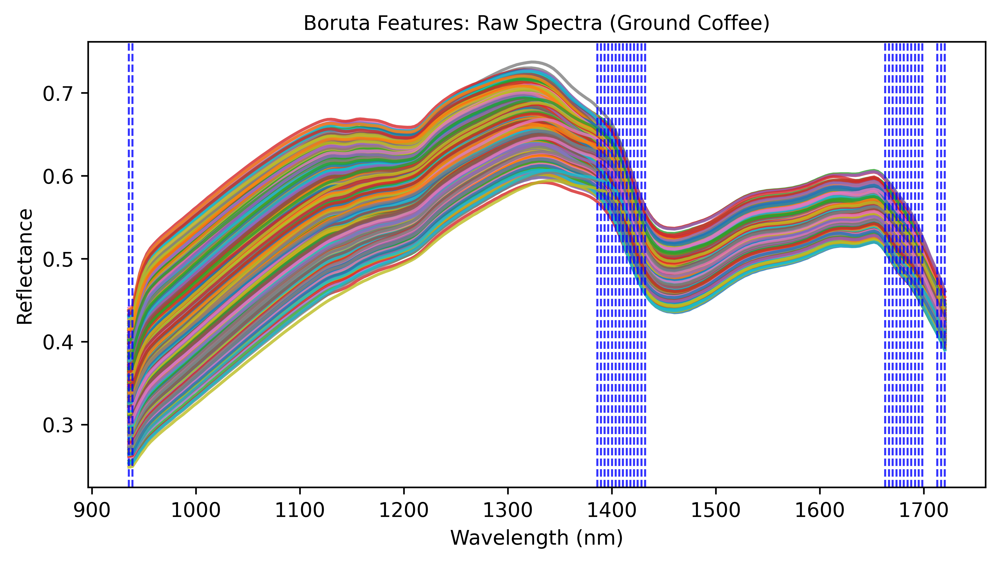

In [217]:
# Get the wavelengths from the column names
wavelengths = X_raw.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_raw  

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_raw.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='blue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: Raw Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Reflectance', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_Raw_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+1st Derivative

In [219]:
selected_wavelengths = [
    "X966.72998", "X970.190002", "X980.580017", "X994.429993", "X997.900024",
    "X1008.299988", "X1011.77002", "X1015.23999", "X1018.710022", "X1022.179993",
    "X1025.650024", "X1029.119995", "X1032.589966", "X1039.530029", "X1119.550049",
    "X1123.040039", "X1126.52002", "X1130.01001", "X1150.939941", "X1154.430054",
    "X1157.930054", "X1161.420044", "X1164.910034", "X1168.400024", "X1171.900024",
    "X1175.390015", "X1379.02002", "X1382.550049", "X1386.079956", "X1389.609985",
    "X1393.140015", "X1396.670044", "X1400.199951", "X1424.920044", "X1428.459961",
    "X1431.98999", "X1435.530029", "X1439.069946", "X1442.599976", "X1446.140015",
    "X1485.089966", "X1488.640015", "X1492.180054", "X1495.72998", "X1499.27002",
    "X1502.819946", "X1506.369995", "X1509.910034", "X1527.660034", "X1531.209961",
    "X1534.76001", "X1538.319946", "X1541.869995", "X1545.420044", "X1548.97998",
    "X1552.530029", "X1556.089966", "X1559.640015", "X1563.199951", "X1566.75",
    "X1570.310059", "X1573.869995", "X1605.920044", "X1609.47998", "X1613.040039",
    "X1616.609985", "X1620.170044", "X1623.73999", "X1627.310059", "X1630.869995",
    "X1634.439941", "X1638.01001", "X1641.579956", "X1645.150024", "X1648.709961",
    "X1652.290039", "X1655.859985", "X1659.430054", "X1663", "X1666.569946",
    "X1670.140015", "X1673.719971", "X1677.290039", "X1684.439941", "X1688.02002",
    "X1691.589966", "X1695.170044", "X1698.75", "X1702.329956", "X1705.910034",
    "X1709.48999", "X1713.069946", "X1716.650024", "X1720.22998"
]

# Convert to numeric by removing 'X' and changing type
selected_wavelengths_msc_sg_1d = [float(wavelength.replace("X", "")) for wavelength in selected_wavelengths]

# Print result
print(selected_wavelengths_msc_sg_1d)

[966.72998, 970.190002, 980.580017, 994.429993, 997.900024, 1008.299988, 1011.77002, 1015.23999, 1018.710022, 1022.179993, 1025.650024, 1029.119995, 1032.589966, 1039.530029, 1119.550049, 1123.040039, 1126.52002, 1130.01001, 1150.939941, 1154.430054, 1157.930054, 1161.420044, 1164.910034, 1168.400024, 1171.900024, 1175.390015, 1379.02002, 1382.550049, 1386.079956, 1389.609985, 1393.140015, 1396.670044, 1400.199951, 1424.920044, 1428.459961, 1431.98999, 1435.530029, 1439.069946, 1442.599976, 1446.140015, 1485.089966, 1488.640015, 1492.180054, 1495.72998, 1499.27002, 1502.819946, 1506.369995, 1509.910034, 1527.660034, 1531.209961, 1534.76001, 1538.319946, 1541.869995, 1545.420044, 1548.97998, 1552.530029, 1556.089966, 1559.640015, 1563.199951, 1566.75, 1570.310059, 1573.869995, 1605.920044, 1609.47998, 1613.040039, 1616.609985, 1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941, 1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039, 1655.859985, 1659.430054, 1663.0, 

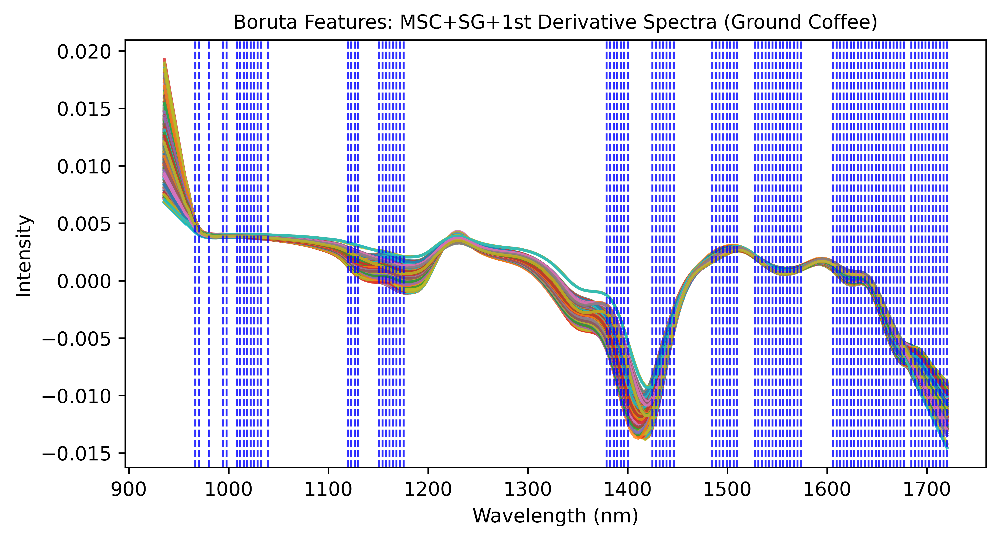

In [220]:
# Get the wavelengths from the column names
wavelengths = X_msc_sg_1d.columns.astype(float)

# Define the selected important wavelengths (replace with your actual selected features)
selected_wavelengths = selected_wavelengths_msc_sg_1d

# Plot the spectral data
plt.figure(figsize=(8, 4), dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='blue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: MSC+SG+1st Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_MSC_SG_1D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+2nd derivative

In [222]:
selected_wavelengths = [
    "X1015.23999", "X1018.710022", "X1022.179993", "X1081.23999", "X1109.099976", 
    "X1112.579956", "X1116.069946", "X1119.550049", "X1123.040039", "X1126.52002",
    "X1130.01001", "X1133.5", "X1136.98999", "X1140.469971", "X1143.959961",
    "X1147.449951", "X1150.939941", "X1154.430054", "X1157.930054", "X1168.400024",
    "X1171.900024", "X1175.390015", "X1178.890015", "X1196.369995", "X1199.869995",
    "X1203.369995", "X1206.869995", "X1210.369995", "X1213.869995", "X1217.369995",
    "X1220.869995", "X1224.369995", "X1227.869995", "X1231.380005", "X1234.880005",
    "X1238.390015", "X1241.890015", "X1245.400024", "X1248.900024", "X1252.410034",
    "X1255.920044", "X1259.420044", "X1262.930054", "X1266.439941", "X1269.949951",
    "X1273.459961", "X1276.969971", "X1280.47998", "X1283.98999", "X1287.51001",
    "X1333.219971", "X1336.73999", "X1340.26001", "X1343.780029", "X1347.300049",
    "X1350.819946", "X1368.439941", "X1371.969971", "X1375.5", "X1379.02002",
    "X1382.550049", "X1386.079956", "X1389.609985", "X1403.72998", "X1407.26001",
    "X1410.790039", "X1414.319946", "X1417.859985", "X1421.390015", "X1485.089966",
    "X1566.75", "X1616.609985", "X1620.170044", "X1623.73999", "X1630.869995",
    "X1634.439941", "X1638.01001", "X1645.150024", "X1648.709961", "X1652.290039",
    "X1655.859985", "X1659.430054", "X1666.569946", "X1670.140015", "X1673.719971",
    "X1677.290039", "X1680.869995", "X1684.439941", "X1688.02002", "X1691.589966",
    "X1695.170044"
]
# Convert to numeric by removing 'X' and changing type
selected_wavelengths_msc_sg_2d = [float(wavelength.replace("X", "")) for wavelength in selected_wavelengths]

# Print result
print(selected_wavelengths_msc_sg_2d)

[1015.23999, 1018.710022, 1022.179993, 1081.23999, 1109.099976, 1112.579956, 1116.069946, 1119.550049, 1123.040039, 1126.52002, 1130.01001, 1133.5, 1136.98999, 1140.469971, 1143.959961, 1147.449951, 1150.939941, 1154.430054, 1157.930054, 1168.400024, 1171.900024, 1175.390015, 1178.890015, 1196.369995, 1199.869995, 1203.369995, 1206.869995, 1210.369995, 1213.869995, 1217.369995, 1220.869995, 1224.369995, 1227.869995, 1231.380005, 1234.880005, 1238.390015, 1241.890015, 1245.400024, 1248.900024, 1252.410034, 1255.920044, 1259.420044, 1262.930054, 1266.439941, 1269.949951, 1273.459961, 1276.969971, 1280.47998, 1283.98999, 1287.51001, 1333.219971, 1336.73999, 1340.26001, 1343.780029, 1347.300049, 1350.819946, 1368.439941, 1371.969971, 1375.5, 1379.02002, 1382.550049, 1386.079956, 1389.609985, 1403.72998, 1407.26001, 1410.790039, 1414.319946, 1417.859985, 1421.390015, 1485.089966, 1566.75, 1616.609985, 1620.170044, 1623.73999, 1630.869995, 1634.439941, 1638.01001, 1645.150024, 1648.709961, 1

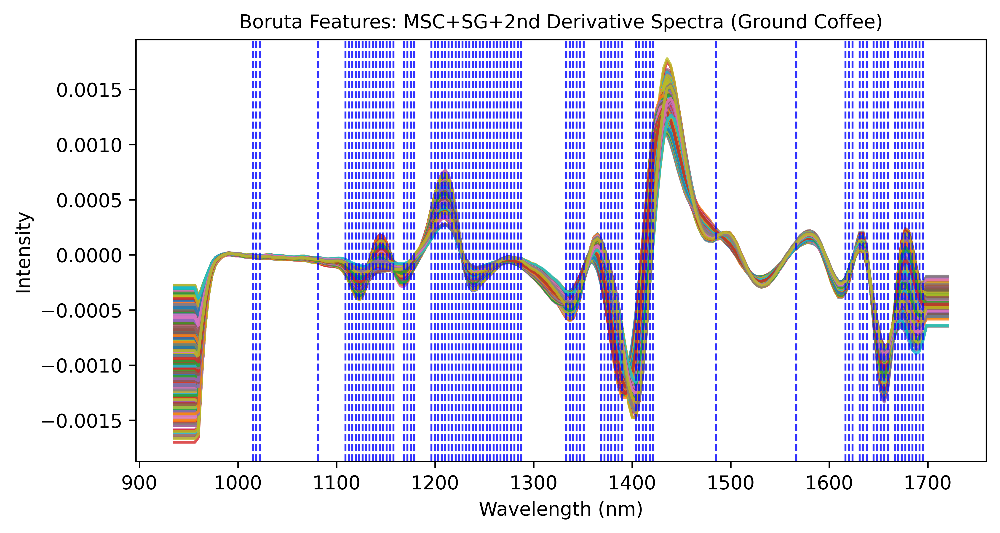

In [223]:
# Get the wavelengths from the column names
wavelengths = X_msc_sg_2d.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_msc_sg_2d

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='blue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: MSC+SG+2nd Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_MSC_SG_2D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### SNV+SG+1st Derivative

In [225]:
selected_wavelengths =[1109.099976, 1112.579956, 1116.069946, 1119.550049, 1123.040039,  
1126.52002, 1130.01001, 1133.5, 1150.939941, 1154.430054,  
1157.930054, 1161.420044, 1164.910034, 1168.400024, 1171.900024,  
1175.390015, 1350.819946, 1354.349976, 1357.869995, 1379.02002,  
1382.550049, 1386.079956, 1389.609985, 1393.140015, 1396.670044,  
1400.199951, 1403.72998, 1417.859985, 1421.390015, 1424.920044,  
1428.459961, 1431.98999, 1435.530029, 1439.069946, 1442.599976,  
1446.140015, 1449.680054, 1485.089966, 1488.640015, 1492.180054,  
1495.72998, 1499.27002, 1502.819946, 1534.76001, 1538.319946,  
1541.869995, 1545.420044, 1548.97998, 1552.530029, 1556.089966,  
1559.640015, 1563.199951, 1566.75, 1570.310059, 1573.869995,  
1602.349976, 1605.920044, 1609.47998, 1613.040039, 1616.609985,  
1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941,  
1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039,  
1655.859985, 1659.430054, 1663, 1666.569946, 1670.140015,  
1673.719971, 1680.869995, 1684.439941, 1688.02002, 1691.589966,  
1695.170044, 1698.75, 1702.329956, 1705.910034, 1709.48999,  
1713.069946, 1716.650024, 1720.22998  
]
# Convert to numeric by removing 'X' and changing type
selected_wavelengths_snv_sg_1d = selected_wavelengths

# Print result
print(selected_wavelengths_snv_sg_1d)

[1109.099976, 1112.579956, 1116.069946, 1119.550049, 1123.040039, 1126.52002, 1130.01001, 1133.5, 1150.939941, 1154.430054, 1157.930054, 1161.420044, 1164.910034, 1168.400024, 1171.900024, 1175.390015, 1350.819946, 1354.349976, 1357.869995, 1379.02002, 1382.550049, 1386.079956, 1389.609985, 1393.140015, 1396.670044, 1400.199951, 1403.72998, 1417.859985, 1421.390015, 1424.920044, 1428.459961, 1431.98999, 1435.530029, 1439.069946, 1442.599976, 1446.140015, 1449.680054, 1485.089966, 1488.640015, 1492.180054, 1495.72998, 1499.27002, 1502.819946, 1534.76001, 1538.319946, 1541.869995, 1545.420044, 1548.97998, 1552.530029, 1556.089966, 1559.640015, 1563.199951, 1566.75, 1570.310059, 1573.869995, 1602.349976, 1605.920044, 1609.47998, 1613.040039, 1616.609985, 1620.170044, 1623.73999, 1627.310059, 1630.869995, 1634.439941, 1638.01001, 1641.579956, 1645.150024, 1648.709961, 1652.290039, 1655.859985, 1659.430054, 1663, 1666.569946, 1670.140015, 1673.719971, 1680.869995, 1684.439941, 1688.02002, 1

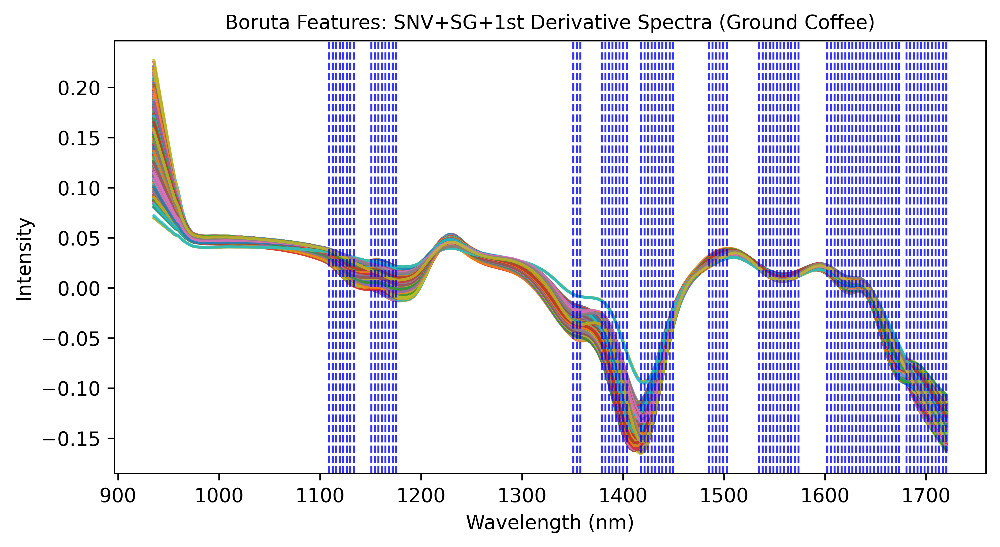

In [226]:
# Get the wavelengths from the column names
wavelengths = X_snv_sg_1d.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_snv_sg_1d

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='blue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: SNV+SG+1st Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_snv_SG_1D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### SNV+SG+2nd Derivative

In [228]:
selected_wavelengths =[1015.23999, 1018.710022, 1022.179993, 1025.650024, 1109.099976,  
1112.579956, 1116.069946, 1119.550049, 1123.040039, 1126.52002,  
1130.01001, 1133.5, 1136.98999, 1140.469971, 1143.959961,  
1147.449951, 1150.939941, 1154.430054, 1157.930054, 1168.400024,  
1171.900024, 1175.390015, 1178.890015, 1196.369995, 1199.869995,  
1203.369995, 1206.869995, 1210.369995, 1213.869995, 1217.369995,  
1220.869995, 1224.369995, 1227.869995, 1234.880005, 1241.890015,  
1245.400024, 1248.900024, 1252.410034, 1255.920044, 1259.420044,  
1262.930054, 1266.439941, 1269.949951, 1273.459961, 1276.969971,  
1280.47998, 1283.98999, 1336.73999, 1340.26001, 1343.780029,  
1347.300049, 1350.819946, 1371.969971, 1375.5, 1379.02002,  
1382.550049, 1386.079956, 1389.609985, 1407.26001, 1410.790039,  
1414.319946, 1417.859985, 1421.390015, 1548.97998, 1552.530029,  
1566.75, 1570.310059, 1573.869995, 1577.430054, 1580.98999,  
1602.349976, 1605.920044, 1613.040039, 1616.609985, 1620.170044,  
1623.73999, 1630.869995, 1634.439941, 1638.01001, 1645.150024,  
1648.709961, 1652.290039, 1655.859985, 1659.430054, 1663,  
1666.569946, 1670.140015, 1673.719971, 1677.290039, 1680.869995,  
1684.439941, 1688.02002, 1691.589966, 1695.170044
]
# Convert to numeric by removing 'X' and changing type
selected_wavelengths_snv_sg_2d = selected_wavelengths

# Print result
print(selected_wavelengths_snv_sg_2d)

[1015.23999, 1018.710022, 1022.179993, 1025.650024, 1109.099976, 1112.579956, 1116.069946, 1119.550049, 1123.040039, 1126.52002, 1130.01001, 1133.5, 1136.98999, 1140.469971, 1143.959961, 1147.449951, 1150.939941, 1154.430054, 1157.930054, 1168.400024, 1171.900024, 1175.390015, 1178.890015, 1196.369995, 1199.869995, 1203.369995, 1206.869995, 1210.369995, 1213.869995, 1217.369995, 1220.869995, 1224.369995, 1227.869995, 1234.880005, 1241.890015, 1245.400024, 1248.900024, 1252.410034, 1255.920044, 1259.420044, 1262.930054, 1266.439941, 1269.949951, 1273.459961, 1276.969971, 1280.47998, 1283.98999, 1336.73999, 1340.26001, 1343.780029, 1347.300049, 1350.819946, 1371.969971, 1375.5, 1379.02002, 1382.550049, 1386.079956, 1389.609985, 1407.26001, 1410.790039, 1414.319946, 1417.859985, 1421.390015, 1548.97998, 1552.530029, 1566.75, 1570.310059, 1573.869995, 1577.430054, 1580.98999, 1602.349976, 1605.920044, 1613.040039, 1616.609985, 1620.170044, 1623.73999, 1630.869995, 1634.439941, 1638.01001, 

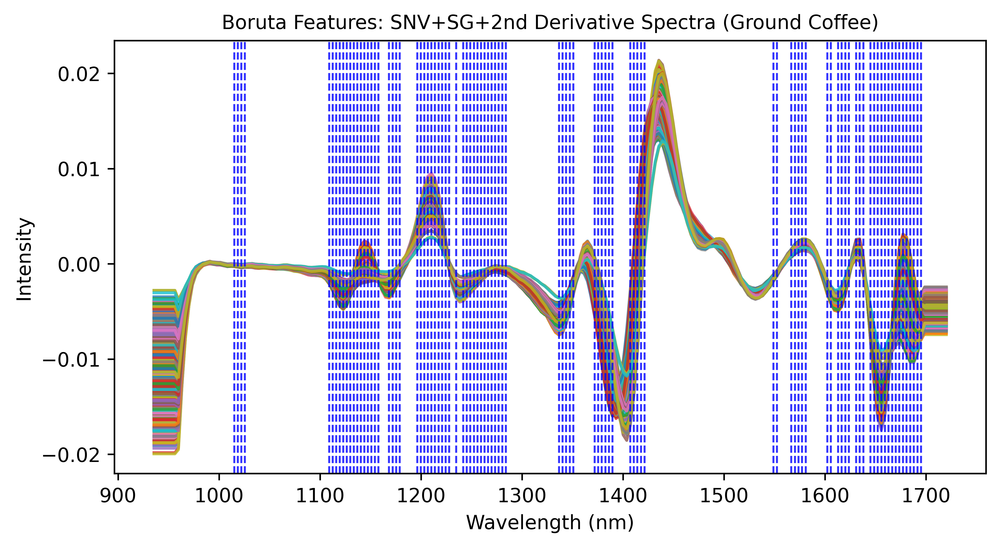

In [229]:
# Get the wavelengths from the column names
wavelengths = X_snv_sg_2d.columns.astype(float)

# Define the selected important wavelengths 
selected_wavelengths = selected_wavelengths_snv_sg_2d

# Plot the spectral data
plt.figure(figsize=(8, 4),dpi=600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='blue', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Boruta Features: SNV+SG+2nd Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("Boruta_SNV_SG_2D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### Wavelengths Selected by Genetic Algorithm

#### Raw Spectra

In [232]:
selected_wavelengths = [949.429993, 952.890015, 959.809998, 966.72998, 973.650024,  
 977.109985, 980.580017, 984.039978, 990.969971, 994.429993,  
 1004.830017, 1008.299988, 1015.23999, 1022.179993, 1025.650024,  
 1029.119995, 1032.589966, 1036.060059, 1043.0, 1046.47998,  
 1049.949951, 1074.290039, 1081.23999, 1084.719971, 1088.199951,  
 1095.170044, 1098.650024, 1102.130005, 1105.609985, 1109.099976,  
 1116.069946, 1119.550049, 1126.52002, 1133.5, 1140.469971,  
 1147.449951, 1150.939941, 1168.400024, 1171.900024, 1175.390015,  
 1182.380005, 1185.880005, 1189.369995, 1203.369995, 1213.869995,  
 1217.369995, 1220.869995, 1224.369995, 1227.869995, 1231.380005,  
 1241.890015, 1266.439941, 1283.98999, 1291.02002, 1294.530029,  
 1308.589966, 1315.619995, 1319.140015, 1340.26001, 1347.300049,  
 1361.390015, 1364.920044, 1368.439941, 1371.969971, 1375.5,  
 1382.550049, 1396.670044, 1400.199951, 1407.26001, 1414.319946,  
 1424.920044, 1428.459961, 1435.530029, 1439.069946, 1442.599976,  
 1449.680054, 1467.380005, 1470.920044, 1474.459961, 1478.01001,  
 1485.089966, 1488.640015, 1492.180054, 1495.72998, 1499.27002,  
 1513.459961, 1517.01001, 1520.560059, 1531.209961, 1534.76001,  
 1545.420044, 1552.530029, 1556.089966, 1563.199951, 1566.75,  
 1570.310059, 1580.98999, 1591.670044, 1602.349976, 1605.920044,  
 1609.47998, 1616.609985, 1620.170044, 1627.310059, 1638.01001,  
 1641.579956, 1645.150024, 1648.709961, 1652.290039, 1655.859985,  
 1659.430054, 1666.569946, 1684.439941, 1695.170044, 1698.75,  
 1702.329956, 1705.910034, 1709.48999]

print(selected_wavelengths)

[949.429993, 952.890015, 959.809998, 966.72998, 973.650024, 977.109985, 980.580017, 984.039978, 990.969971, 994.429993, 1004.830017, 1008.299988, 1015.23999, 1022.179993, 1025.650024, 1029.119995, 1032.589966, 1036.060059, 1043.0, 1046.47998, 1049.949951, 1074.290039, 1081.23999, 1084.719971, 1088.199951, 1095.170044, 1098.650024, 1102.130005, 1105.609985, 1109.099976, 1116.069946, 1119.550049, 1126.52002, 1133.5, 1140.469971, 1147.449951, 1150.939941, 1168.400024, 1171.900024, 1175.390015, 1182.380005, 1185.880005, 1189.369995, 1203.369995, 1213.869995, 1217.369995, 1220.869995, 1224.369995, 1227.869995, 1231.380005, 1241.890015, 1266.439941, 1283.98999, 1291.02002, 1294.530029, 1308.589966, 1315.619995, 1319.140015, 1340.26001, 1347.300049, 1361.390015, 1364.920044, 1368.439941, 1371.969971, 1375.5, 1382.550049, 1396.670044, 1400.199951, 1407.26001, 1414.319946, 1424.920044, 1428.459961, 1435.530029, 1439.069946, 1442.599976, 1449.680054, 1467.380005, 1470.920044, 1474.459961, 1478.0

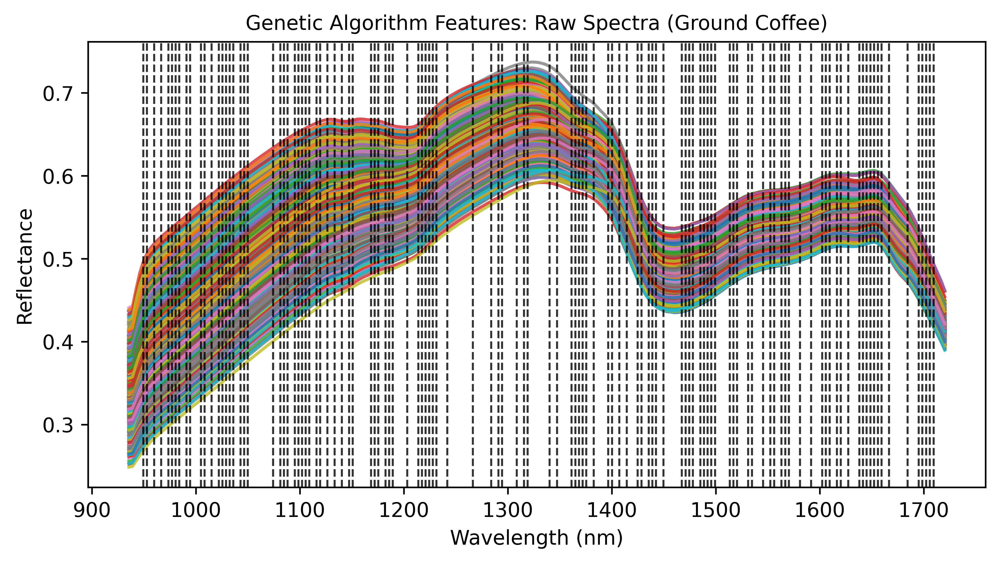

In [233]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_raw.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: Raw Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Reflectance', fontsize=10)
plt.grid(False)
plt.savefig("GA_Raw_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+first derivative

In [235]:
selected_wavelengths = [935.609985, 942.52002, 945.97998, 952.890015, 984.039978,  
 990.969971, 994.429993, 1001.369995, 1004.830017, 1008.299988,  
 1025.650024, 1029.119995, 1032.589966, 1039.530029, 1043.0,  
 1049.949951, 1056.900024, 1063.849976, 1074.290039, 1077.76001,  
 1081.23999, 1084.719971, 1088.199951, 1098.650024, 1102.130005,  
 1109.099976, 1126.52002, 1136.98999, 1147.449951, 1154.430054,  
 1157.930054, 1161.420044, 1168.400024, 1171.900024, 1185.880005,  
 1189.369995, 1196.369995, 1203.369995, 1217.369995, 1224.369995,  
 1231.380005, 1234.880005, 1241.890015, 1266.439941, 1283.98999,  
 1291.02002, 1294.530029, 1308.589966, 1315.619995, 1319.140015,  
 1340.26001, 1347.300049, 1361.390015, 1364.920044, 1368.439941,  
 1371.969971, 1375.5, 1382.550049, 1396.670044, 1400.199951,  
 1417.859985, 1421.390015, 1435.530029, 1439.069946, 1442.599976,  
 1446.140015, 1456.76001, 1460.300049, 1474.459961, 1488.640015,  
 1492.180054, 1499.27002, 1509.910034, 1513.459961, 1527.660034,  
 1545.420044, 1548.97998, 1556.089966, 1566.75, 1570.310059,  
 1573.869995, 1580.98999, 1605.920044, 1609.47998, 1616.609985,  
 1627.310059, 1630.869995, 1645.150024, 1652.290039, 1655.859985,  
 1673.719971, 1684.439941, 1695.170044, 1698.75, 1716.650024]

print(selected_wavelengths)

[935.609985, 942.52002, 945.97998, 952.890015, 984.039978, 990.969971, 994.429993, 1001.369995, 1004.830017, 1008.299988, 1025.650024, 1029.119995, 1032.589966, 1039.530029, 1043.0, 1049.949951, 1056.900024, 1063.849976, 1074.290039, 1077.76001, 1081.23999, 1084.719971, 1088.199951, 1098.650024, 1102.130005, 1109.099976, 1126.52002, 1136.98999, 1147.449951, 1154.430054, 1157.930054, 1161.420044, 1168.400024, 1171.900024, 1185.880005, 1189.369995, 1196.369995, 1203.369995, 1217.369995, 1224.369995, 1231.380005, 1234.880005, 1241.890015, 1266.439941, 1283.98999, 1291.02002, 1294.530029, 1308.589966, 1315.619995, 1319.140015, 1340.26001, 1347.300049, 1361.390015, 1364.920044, 1368.439941, 1371.969971, 1375.5, 1382.550049, 1396.670044, 1400.199951, 1417.859985, 1421.390015, 1435.530029, 1439.069946, 1442.599976, 1446.140015, 1456.76001, 1460.300049, 1474.459961, 1488.640015, 1492.180054, 1499.27002, 1509.910034, 1513.459961, 1527.660034, 1545.420044, 1548.97998, 1556.089966, 1566.75, 1570.

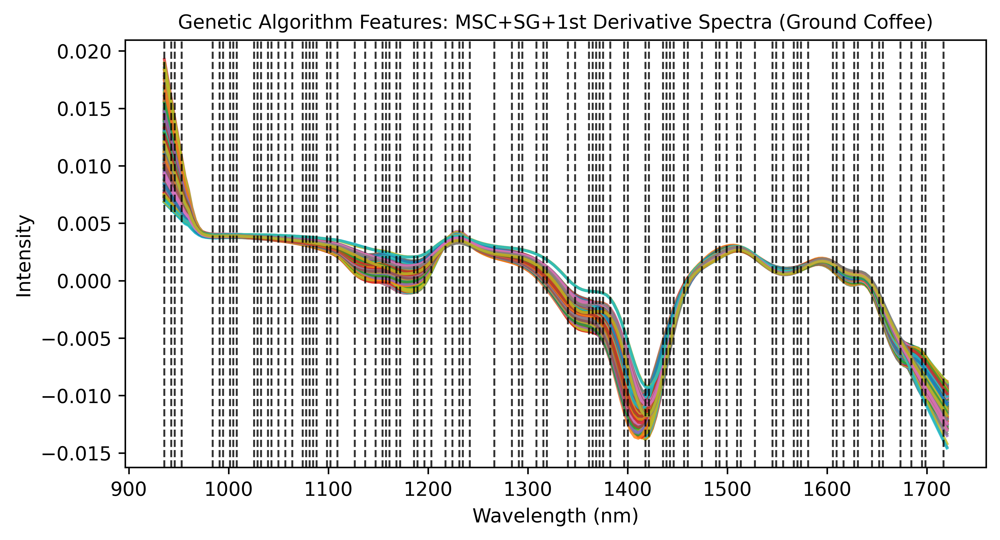

In [236]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: MSC+SG+1st Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_MSC+SG+1D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### MSC+SG+second derivative

In [238]:
selected_wavelengths = [935.609985, 942.52002, 945.97998, 949.429993, 963.27002,  
 970.190002, 973.650024, 1011.77002, 1015.23999, 1018.710022,  
 1025.650024, 1029.119995, 1032.589966, 1036.060059, 1039.530029,  
 1056.900024, 1088.199951, 1091.680054, 1123.040039, 1126.52002,  
 1130.01001, 1136.98999, 1150.939941, 1154.430054, 1164.910034,  
 1168.400024, 1171.900024, 1175.390015, 1178.890015, 1203.369995,  
 1217.369995, 1224.369995, 1227.869995, 1231.380005, 1234.880005,  
 1245.400024, 1248.900024, 1255.920044, 1259.420044, 1262.930054,  
 1273.459961, 1280.47998, 1312.109985, 1319.140015, 1322.660034,  
 1333.219971, 1336.73999, 1340.26001, 1354.349976, 1357.869995,  
 1361.390015, 1364.920044, 1371.969971, 1400.199951, 1410.790039,  
 1421.390015, 1424.920044, 1474.459961, 1485.089966, 1488.640015,  
 1492.180054, 1495.72998, 1509.910034, 1513.459961, 1520.560059,  
 1527.660034, 1531.209961, 1538.319946, 1541.869995, 1548.97998,  
 1552.530029, 1556.089966, 1566.75, 1570.310059, 1573.869995,  
 1580.98999, 1595.22998, 1627.310059, 1630.869995, 1638.01001,  
 1652.290039, 1655.859985, 1659.430054, 1666.569946, 1670.140015,  
 1673.719971, 1677.290039, 1691.589966, 1695.170044, 1698.75,  
 1702.329956, 1713.069946]

print(selected_wavelengths)

[935.609985, 942.52002, 945.97998, 949.429993, 963.27002, 970.190002, 973.650024, 1011.77002, 1015.23999, 1018.710022, 1025.650024, 1029.119995, 1032.589966, 1036.060059, 1039.530029, 1056.900024, 1088.199951, 1091.680054, 1123.040039, 1126.52002, 1130.01001, 1136.98999, 1150.939941, 1154.430054, 1164.910034, 1168.400024, 1171.900024, 1175.390015, 1178.890015, 1203.369995, 1217.369995, 1224.369995, 1227.869995, 1231.380005, 1234.880005, 1245.400024, 1248.900024, 1255.920044, 1259.420044, 1262.930054, 1273.459961, 1280.47998, 1312.109985, 1319.140015, 1322.660034, 1333.219971, 1336.73999, 1340.26001, 1354.349976, 1357.869995, 1361.390015, 1364.920044, 1371.969971, 1400.199951, 1410.790039, 1421.390015, 1424.920044, 1474.459961, 1485.089966, 1488.640015, 1492.180054, 1495.72998, 1509.910034, 1513.459961, 1520.560059, 1527.660034, 1531.209961, 1538.319946, 1541.869995, 1548.97998, 1552.530029, 1556.089966, 1566.75, 1570.310059, 1573.869995, 1580.98999, 1595.22998, 1627.310059, 1630.869995

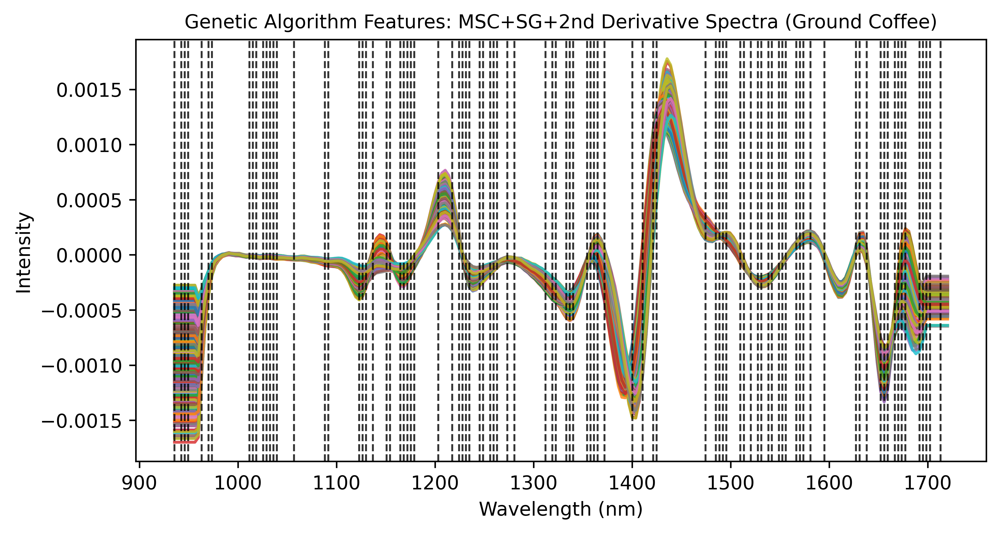

In [239]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_msc_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: MSC+SG+2nd Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_MSC+SG+2D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

In [240]:
selected_wavelengths = [935.609985, 942.52002, 945.97998, 949.429993, 963.27002,  
 970.190002, 973.650024, 1011.77002, 1015.23999, 1018.710022,  
 1025.650024, 1029.119995, 1032.589966, 1036.060059, 1039.530029,  
 1056.900024, 1088.199951, 1091.680054, 1123.040039, 1126.52002,  
 1130.01001, 1136.98999, 1150.939941, 1154.430054, 1164.910034,  
 1168.400024, 1171.900024, 1175.390015, 1178.890015, 1203.369995,  
 1217.369995, 1224.369995, 1227.869995, 1231.380005, 1234.880005,  
 1245.400024, 1248.900024, 1255.920044, 1259.420044, 1266.439941,  
 1269.949951, 1273.459961, 1276.969971, 1283.98999, 1298.050049,  
 1301.560059, 1305.079956, 1308.589966, 1312.109985, 1315.619995,  
 1326.180054, 1333.219971, 1343.780029, 1347.300049, 1350.819946,  
 1354.349976, 1364.920044, 1368.439941, 1375.5, 1382.550049,  
 1396.670044, 1400.199951, 1403.72998, 1421.390015, 1431.98999,  
 1442.599976, 1446.140015, 1460.300049, 1463.839966, 1467.380005,  
 1474.459961, 1481.550049, 1485.089966, 1492.180054, 1495.72998,  
 1499.27002, 1509.910034, 1513.459961, 1517.01001, 1531.209961,  
 1541.869995, 1548.97998, 1552.530029, 1556.089966, 1559.640015,  
 1563.199951, 1570.310059, 1580.98999, 1591.670044, 1602.349976,  
 1605.920044, 1609.47998, 1616.609985, 1620.170044, 1627.310059,  
 1638.01001, 1641.579956, 1645.150024, 1652.290039, 1655.859985,  
 1659.430054, 1666.569946, 1670.140015, 1673.719971, 1677.290039,  
 1691.589966, 1695.170044, 1698.75, 1702.329956, 1713.069946]

print(selected_wavelengths)

[935.609985, 942.52002, 945.97998, 949.429993, 963.27002, 970.190002, 973.650024, 1011.77002, 1015.23999, 1018.710022, 1025.650024, 1029.119995, 1032.589966, 1036.060059, 1039.530029, 1056.900024, 1088.199951, 1091.680054, 1123.040039, 1126.52002, 1130.01001, 1136.98999, 1150.939941, 1154.430054, 1164.910034, 1168.400024, 1171.900024, 1175.390015, 1178.890015, 1203.369995, 1217.369995, 1224.369995, 1227.869995, 1231.380005, 1234.880005, 1245.400024, 1248.900024, 1255.920044, 1259.420044, 1266.439941, 1269.949951, 1273.459961, 1276.969971, 1283.98999, 1298.050049, 1301.560059, 1305.079956, 1308.589966, 1312.109985, 1315.619995, 1326.180054, 1333.219971, 1343.780029, 1347.300049, 1350.819946, 1354.349976, 1364.920044, 1368.439941, 1375.5, 1382.550049, 1396.670044, 1400.199951, 1403.72998, 1421.390015, 1431.98999, 1442.599976, 1446.140015, 1460.300049, 1463.839966, 1467.380005, 1474.459961, 1481.550049, 1485.089966, 1492.180054, 1495.72998, 1499.27002, 1509.910034, 1513.459961, 1517.01001

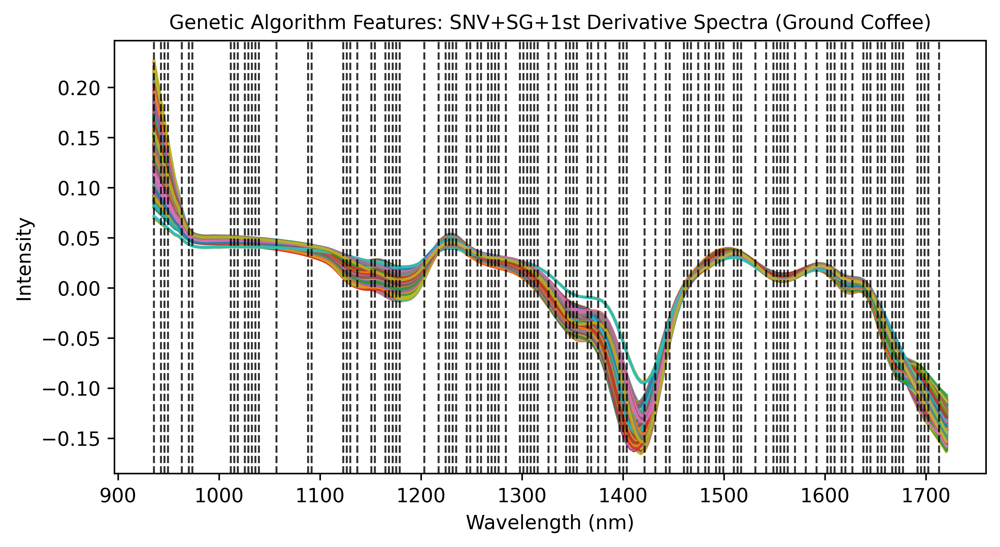

In [241]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_1d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")

# Add title and labels
plt.title('Genetic Algorithm Features: SNV+SG+1st Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_SNV+SG+1D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()

### SNV+SG+2nd Derivative

In [243]:
selected_wavelengths = [939.059998, 942.52002, 949.429993, 952.890015, 959.809998,  
 963.27002, 970.190002, 973.650024, 987.51001, 997.900024,  
 1004.830017, 1011.77002, 1015.23999, 1018.710022, 1022.179993,  
 1025.650024, 1029.119995, 1032.589966, 1046.47998, 1056.900024,  
 1060.380005, 1063.849976, 1070.810059, 1081.23999, 1088.199951,  
 1098.650024, 1112.579956, 1116.069946, 1119.550049, 1123.040039,  
 1136.98999, 1140.469971, 1143.959961, 1157.930054, 1164.910034,  
 1178.890015, 1182.380005, 1189.369995, 1196.369995, 1199.869995,  
 1210.369995, 1213.869995, 1224.369995, 1227.869995, 1234.880005,  
 1238.390015, 1241.890015, 1245.400024, 1248.900024, 1252.410034,  
 1262.930054, 1266.439941, 1269.949951, 1273.459961, 1276.969971,  
 1287.51001, 1291.02002, 1294.530029, 1298.050049, 1305.079956,  
 1308.589966, 1315.619995, 1319.140015, 1329.699951, 1333.219971,  
 1343.780029, 1350.819946, 1368.439941, 1371.969971, 1382.550049,  
 1386.079956, 1393.140015, 1403.72998, 1414.319946, 1417.859985,  
 1421.390015, 1424.920044, 1435.530029, 1442.599976, 1456.76001,  
 1467.380005, 1470.920044, 1474.459961, 1488.640015, 1495.72998,  
 1509.910034, 1513.459961, 1520.560059, 1527.660034, 1531.209961,  
 1541.869995, 1545.420044, 1556.089966, 1559.640015, 1563.199951,  
 1570.310059, 1577.430054, 1580.98999, 1588.109985, 1591.670044,  
 1595.22998, 1602.349976, 1609.47998, 1613.040039, 1616.609985,  
 1627.310059, 1634.439941, 1648.709961, 1655.859985, 1659.430054,  
 1670.140015, 1673.719971, 1677.290039, 1684.439941, 1688.02002,  
 1691.589966, 1695.170044, 1698.75, 1702.329956, 1713.069946]

print(selected_wavelengths)

[939.059998, 942.52002, 949.429993, 952.890015, 959.809998, 963.27002, 970.190002, 973.650024, 987.51001, 997.900024, 1004.830017, 1011.77002, 1015.23999, 1018.710022, 1022.179993, 1025.650024, 1029.119995, 1032.589966, 1046.47998, 1056.900024, 1060.380005, 1063.849976, 1070.810059, 1081.23999, 1088.199951, 1098.650024, 1112.579956, 1116.069946, 1119.550049, 1123.040039, 1136.98999, 1140.469971, 1143.959961, 1157.930054, 1164.910034, 1178.890015, 1182.380005, 1189.369995, 1196.369995, 1199.869995, 1210.369995, 1213.869995, 1224.369995, 1227.869995, 1234.880005, 1238.390015, 1241.890015, 1245.400024, 1248.900024, 1252.410034, 1262.930054, 1266.439941, 1269.949951, 1273.459961, 1276.969971, 1287.51001, 1291.02002, 1294.530029, 1298.050049, 1305.079956, 1308.589966, 1315.619995, 1319.140015, 1329.699951, 1333.219971, 1343.780029, 1350.819946, 1368.439941, 1371.969971, 1382.550049, 1386.079956, 1393.140015, 1403.72998, 1414.319946, 1417.859985, 1421.390015, 1424.920044, 1435.530029, 1442.5

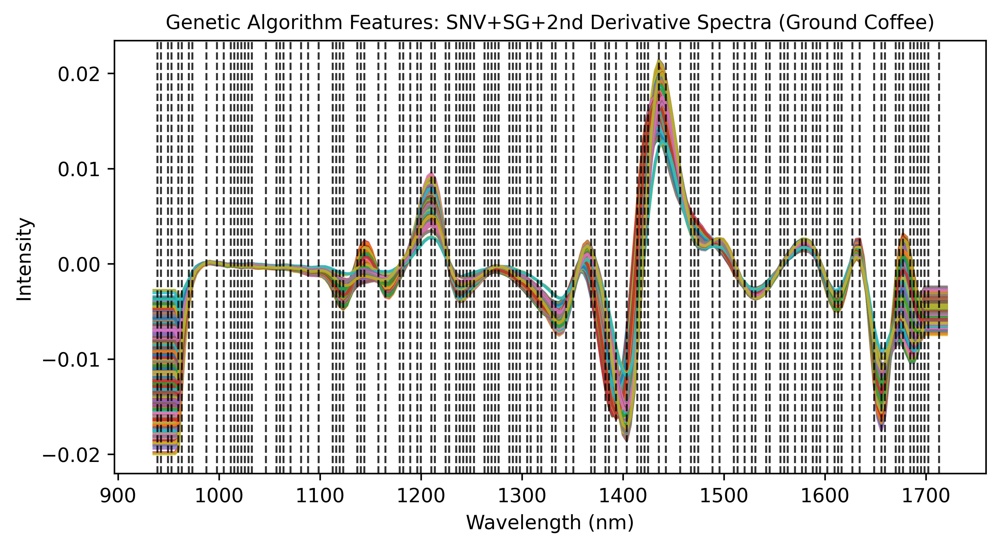

In [244]:
# Plot the spectral data
plt.figure(figsize=(8, 4),dpi = 600)

# Iterate through each row in the spectral data and plot the spectrum
for index, row in X_snv_sg_2d.iterrows():
    plt.plot(wavelengths, row, label=f'Sample {index}', alpha=0.8) 

# Highlight selected wavelengths with vertical dashed lines
for wave in selected_wavelengths:
    plt.axvline(x=wave, color='black', linestyle='dashed', linewidth=1, alpha=0.8, label="Selected Wavelengths" if wave == selected_wavelengths[0] else "")
# Add title and labels
plt.title('Genetic Algorithm Features: SNV+SG+2nd Derivative Spectra (Ground Coffee)', fontsize=10)
plt.xlabel('Wavelength (nm)', fontsize=10)
plt.ylabel('Intensity', fontsize=10)
plt.grid(False)
plt.savefig("GA_SNV+SG+2D_Ground_Coffee.png", dpi=600, bbox_inches="tight", format="png")
plt.show()